<a href="https://colab.research.google.com/github/cromcruach52/Snapfolia-Leaf-Detection-and-Classification/blob/main/Leaf_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [5]:
!pip install torch-lr-finder

In [6]:
!pip install split-folders

In [1]:
!pip install seaborn --upgrade

  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.12.2
    Uninstalling seaborn-0.12.2:
      Successfully uninstalled seaborn-0.12.2


In [4]:
import os
import pandas as pd
import random
import seaborn as sns
import cv2
import torch
import torchvision
import shutil

from PIL import Image
from torch.utils.data import WeightedRandomSampler
from torch_lr_finder import LRFinder
from torch.optim.lr_scheduler import ReduceLROnPlateau, CyclicLR
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
from torch import nn
from torch.optim import Adam

import torchvision.models as models
import torch.nn.functional as F
from sklearn.metrics import classification_report, confusion_matrix
from torch.utils.data import Dataset, DataLoader
import splitfolders
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
import time
import copy

from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier

C:\Users\faith\anaconda3\Lib\site-packages\torch_lr_finder\lr_finder.py:5: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


# I. Data Preparation Phase

In [30]:
leaf_path = "Samples\Leaf_Samples"
output_dir = "Samples\splitted_dataC"

In [31]:
def sobel_edge_detection(image):
    image = np.array(image)
    channels = []
    for i in range(3):
        gray = image[:, :, i]
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
        sobel = np.sqrt(sobelx**2 + sobely**2)
        sobel = np.uint8(sobel)
        channels.append(sobel)
    sobel = np.stack(channels, axis=-1)
    return Image.fromarray(sobel)

class SobelEdgeDetection(object):
    def __call__(self, img):
        return sobel_edge_detection(img)

In [32]:
data_transforms = transforms.Compose([
    transforms.Resize(size=(224, 224)),
    SobelEdgeDetection(),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [33]:
class LeafDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []
        self.labels = []

        class_labels = sorted(os.listdir(root_dir))
        for label_idx, label in enumerate(class_labels):
            class_dir = os.path.join(root_dir, label)
            if os.path.isdir(class_dir):
                for img_path in os.listdir(class_dir):
                    img_path = os.path.join(class_dir, img_path)
                    self.image_paths.append(img_path)
                    label_vector = [0] * len(class_labels)
                    label_vector[label_idx] = 1
                    self.labels.append(label_vector)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]

        img = Image.open(img_path).convert('RGB')

        if self.transform:
            img = self.transform(img)

        return img, torch.tensor(label)

In [34]:
def visualize_images_before_after(dataset, transform, num_images=10):
    num_rows = (num_images + 1) // 2
    fig, ax = plt.subplots(num_rows, 4, figsize=(20, 5 * num_rows))

    for i in range(num_images):
        row = i // 2
        col = (i % 2) * 2

        sample_index = random.randint(0, len(dataset) - 1)
        img_path, label = dataset.imgs[sample_index]

        img = Image.open(img_path).convert('RGB')
        ax[row, col].imshow(img)
        ax[row, col].title.set_text(f"Original Image - {'Leaf' if label == 0 else 'Non-Leaf'}")

        img_transformed = transform(img)
        img_transformed = img_transformed.permute(1, 2, 0).numpy()
        img_transformed = (img_transformed * 0.229) + 0.485
        ax[row, col + 1].imshow(img_transformed)
        ax[row, col + 1].title.set_text(f"Processed Image - {'Leaf' if label == 0 else 'Non-Leaf'}")

    plt.tight_layout()
    plt.show()

In [42]:
def split_dataset(root_dir, output_dir, test_ratio=0.1, val_ratio=0.2):
    # Creating output directories
    train_dir = os.path.join(output_dir, 'train')
    val_dir = os.path.join(output_dir, 'val')
    test_dir = os.path.join(output_dir, 'test')

    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(val_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)

    class_dirs = [d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))]

    for class_dir in class_dirs:
        class_path = os.path.join(root_dir, class_dir)
        images = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
        random.shuffle(images)

        num_total = len(images)
        num_test = int(num_total * test_ratio)
        num_val = int(num_total * val_ratio)
        num_train = num_total - num_val - num_test

        test_images = images[:num_test]
        val_images = images[num_test:num_test+num_val]
        train_images = images[num_test+num_val:]

        os.makedirs(os.path.join(test_dir, class_dir), exist_ok=True)
        for img in test_images:
            shutil.copy(os.path.join(class_path, img), os.path.join(test_dir, class_dir, img))

        os.makedirs(os.path.join(val_dir, class_dir), exist_ok=True)
        for img in val_images:
            shutil.copy(os.path.join(class_path, img), os.path.join(val_dir, class_dir, img))

        os.makedirs(os.path.join(train_dir, class_dir), exist_ok=True)
        for img in train_images:
            shutil.copy(os.path.join(class_path, img), os.path.join(train_dir, class_dir, img))

    print("Dataset split completed.")

In [43]:
split_dataset(leaf_path, output_dir)

Dataset split completed.


In [44]:
# Load datasets
train = datasets.ImageFolder(root=os.path.join(output_dir, "train"), transform=data_transforms)
val = datasets.ImageFolder(root=os.path.join(output_dir, "val"), transform=data_transforms)
test = datasets.ImageFolder(root=os.path.join(output_dir, "test"), transform=data_transforms)

In [45]:
train_loader = DataLoader(dataset=train,
                             batch_size=32,
                             num_workers=0,
                             shuffle=True,
                             pin_memory=True)

val_loader = DataLoader(dataset=val,
                             batch_size=32,
                             num_workers=0,
                             shuffle=True,
                             pin_memory=True)

test_loader = DataLoader(dataset=test,
                             batch_size=32,
                             num_workers=0,
                             shuffle=False,
                             pin_memory=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

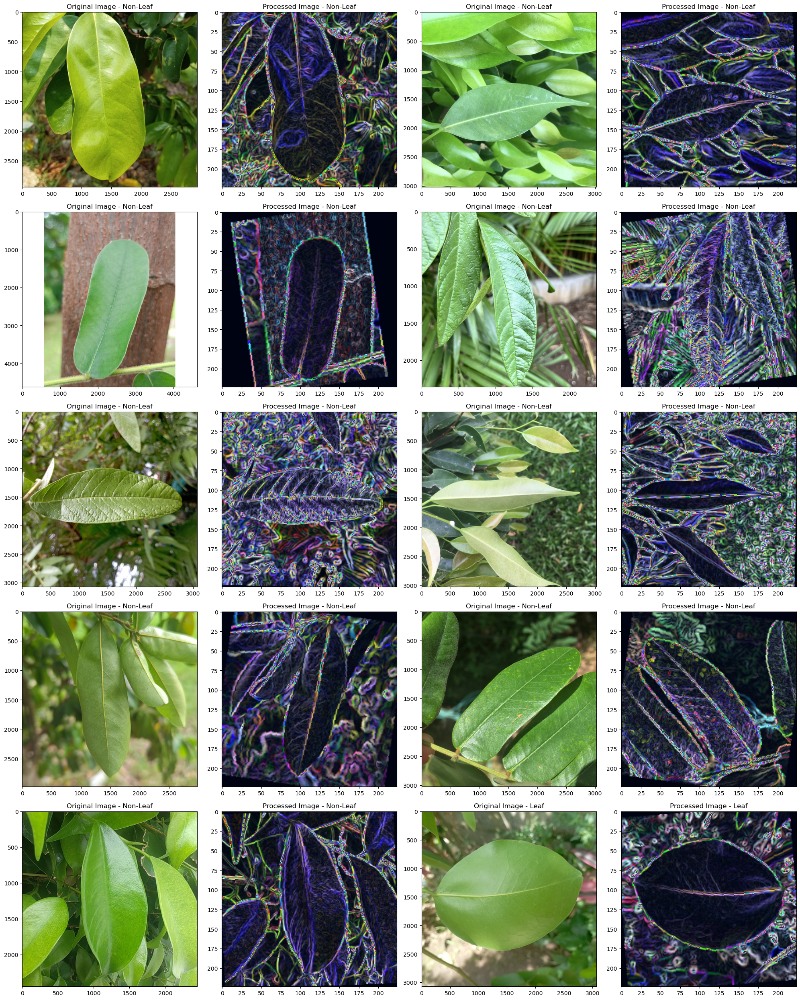

In [39]:
visualize_images_before_after(train, data_transforms, num_images=10)

In [46]:
class_to_idx = train.class_to_idx
idx_to_class = {v: k for k, v in class_to_idx.items()}

print("Dataset Labels:\n", class_to_idx, "\n")

for name, dataset in zip(["TRAIN", "VALIDATION", "TEST"], [train, val, test]):
    images_per_class = pd.Series([class_to_idx[dataset.classes[target]] for target in dataset.targets]).value_counts()
    print(f"Images per Class in {name}:")
    for idx in sorted(images_per_class.index):
        print(f"{idx}    {idx_to_class[idx]}: {images_per_class[idx]}")
    print()

Dataset Labels:
 {'Apitong': 0, 'Balayong': 1, 'Balete': 2, 'Bayabas': 3, 'Guyabano': 4} 

Images per Class in TRAIN:
0    Apitong: 70
1    Balayong: 70
2    Balete: 70
3    Bayabas: 70
4    Guyabano: 70

Images per Class in VALIDATION:
0    Apitong: 20
1    Balayong: 20
2    Balete: 20
3    Bayabas: 20
4    Guyabano: 20

Images per Class in TEST:
0    Apitong: 10
1    Balayong: 10
2    Balete: 10
3    Bayabas: 10
4    Guyabano: 10



# II. Model Setup Phase

In [20]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [21]:
resnet = torch.hub.load('pytorch/vision:v0.10.0', 'resnet50', weights=models.ResNet50_Weights.DEFAULT)

Using cache found in C:\Users\faith/.cache\torch\hub\pytorch_vision_v0.10.0


In [22]:
for param in resnet.parameters():
    param.requires_grad = False

In [23]:
num_ftrs = resnet.fc.in_features
resnet.fc = nn.Linear(num_ftrs, 5)

In [24]:
model = resnet.to(device)

# III. Loss Function and Optimizer Setup

In [25]:
dataset = LeafDataset(leaf_path, transform=data_transforms)
class_labels = sorted(os.listdir(leaf_path))
num_ftrs = resnet.fc.in_features
num_classes = len(class_labels)
print("Class labels:", class_labels)

Class labels: ['Apitong', 'Balayong', 'Balete', 'Bayabas', 'Guyabano']


In [47]:
total_samples = len(train)
samples_per_class = [len(os.listdir(os.path.join(leaf_path, label))) for label in class_labels]

print("Samples per class:", samples_per_class)

initial_class_weights = [total_samples / samples_per_class[i] for i in range(len(class_labels))]

class_weights = [np.log1p(weight) for weight in initial_class_weights]

print("Initial class weights:", initial_class_weights)
print("Log-scaled class weights:", class_weights)


weights = torch.tensor(class_weights).to(device)

criterion = nn.BCEWithLogitsLoss(pos_weight=weights)

optimizer = optim.Adam(model.parameters(), lr=0.001)

Samples per class: [100, 100, 100, 100, 100]
Initial class weights: [3.5, 3.5, 3.5, 3.5, 3.5]
Log-scaled class weights: [1.5040773967762742, 1.5040773967762742, 1.5040773967762742, 1.5040773967762742, 1.5040773967762742]


In [48]:
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=2)

# IV. Training Phase

In [ ]:
def train_model(model, criterion, optimizer, train_loader, val_loader, scheduler, num_epochs=64, patience=5, checkpoint_interval=5):
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    train_acc_history = []
    val_acc_history = []
    train_loss_history = []
    val_loss_history = []

    early_stopping_counter = 0
    best_loss = float('inf')
    early_stop = False  

    for epoch in range(num_epochs):
        if early_stop:  
            print('Breaking out of epoch loop due to early stopping.')
            break  

        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)
        
        lr = optimizer.param_groups[0]['lr']
        print(f'Learning Rate: {lr}')

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
                data_loader = train_loader
            else:
                model.eval()
                data_loader = val_loader

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in data_loader:
                inputs = inputs.cuda()
                labels = labels.cuda().long()

                labels = F.one_hot(labels, num_classes=5).float()

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                preds = outputs > 0.5
                corrects = (preds == labels).sum().item()
                running_corrects += corrects
                running_loss += loss.item() * inputs.size(0)

            epoch_loss = running_loss / len(data_loader.dataset)
            epoch_acc = running_corrects / (len(data_loader.dataset) * num_classes)

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            if phase == 'train':
                train_acc_history.append(epoch_acc)
                train_loss_history.append(epoch_loss)
            else:
                val_acc_history.append(epoch_acc)
                val_loss_history.append(epoch_loss)

            if phase == 'val':
                scheduler.step(epoch_loss)  
                if epoch_acc > best_acc:
                    best_acc = epoch_acc
                if epoch_loss < best_loss:
                    best_loss = epoch_loss
                    best_model_wts = copy.deepcopy(model.state_dict())
                    early_stopping_counter = 0
                else:
                    early_stopping_counter += 1
                    print(f'Early stopping counter: {early_stopping_counter} out of {patience}')
                    if early_stopping_counter >= patience:
                        model.load_state_dict(best_model_wts)
                        print(f'Early stopping triggered.')
                        early_stop = True  
                        break

        if (epoch + 1) % checkpoint_interval == 0:
            checkpoint_path = f'model_checkpoint_epoch_{epoch+1}.pth'
            torch.save(model.state_dict(), checkpoint_path)
            print(f'Checkpoint saved at epoch {epoch+1}')

    time_elapsed = time.time() - since
    print(f'Training completed in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

    return model, train_acc_history, val_acc_history, train_loss_history, val_loss_history, time_elapsed, best_loss, best_acc

model, train_acc_history, val_acc_history, train_loss_history, val_loss_history, training_time, best_loss, best_acc = train_model(
    model, criterion, optimizer, train_loader, val_loader, scheduler, num_epochs=64, patience=5)

torch.save(model.state_dict(), 'final_model.pth')

print("Training finished...\n")

Epoch 1/64
----------
Learning Rate: 0.001
train Loss: 0.6170 Acc: 0.8000
val Loss: 0.5867 Acc: 0.8000
Epoch 2/64
----------
Learning Rate: 0.001
train Loss: 0.5539 Acc: 0.8000
val Loss: 0.5406 Acc: 0.8000
Epoch 3/64
----------
Learning Rate: 0.001
train Loss: 0.4923 Acc: 0.8006
val Loss: 0.5003 Acc: 0.8060
Epoch 4/64
----------
Learning Rate: 0.001
train Loss: 0.4571 Acc: 0.8149
val Loss: 0.4682 Acc: 0.8120
Epoch 5/64
----------
Learning Rate: 0.001
train Loss: 0.4193 Acc: 0.8377
val Loss: 0.4419 Acc: 0.8300
Checkpoint saved at epoch 5
Epoch 6/64
----------
Learning Rate: 0.001
train Loss: 0.3930 Acc: 0.8360
val Loss: 0.4356 Acc: 0.8300
Epoch 7/64
----------
Learning Rate: 0.001
train Loss: 0.3628 Acc: 0.8714
val Loss: 0.4000 Acc: 0.8500
Epoch 8/64
----------
Learning Rate: 0.001
train Loss: 0.3512 Acc: 0.8754
val Loss: 0.3990 Acc: 0.8540
Epoch 9/64
----------
Learning Rate: 0.001
train Loss: 0.3353 Acc: 0.8846
val Loss: 0.3787 Acc: 0.8620
Epoch 10/64
----------
Learning Rate: 0.001
t

In [ ]:
import numpy as np
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.metrics import classification_report

def test_model(model, test_loader, device, class_labels):
    all_predictions = []
    all_labels = []

    with torch.no_grad():
        for data in test_loader:
            inputs, outputs = data
            inputs, outputs = inputs.to(device), outputs.to(device)
            predictions = model(inputs)
            _, predicted = torch.max(predictions, 1)
            all_predictions.extend(predicted.to("cpu").numpy())
            all_labels.extend(outputs.to("cpu").numpy())

    # Convert predictions and labels to numpy arrays
    all_predictions = np.array(all_predictions)
    all_labels = np.array(all_labels)

    # Individual models
    models = [
        ('svm', SVC()),
        ('knn', KNeighborsClassifier()),
        ('dt', DecisionTreeClassifier()),
        ('rf', RandomForestClassifier()),
    ]

    for name, model in models:
        model.fit(all_predictions.reshape(-1, 1), all_labels)
        preds = model.predict(all_predictions.reshape(-1, 1))
        print(f"{name.upper()} Classification Report:")
        print(classification_report(all_labels, preds, target_names=class_labels, zero_division=1))

    # Voting Classifier
    voting_model = VotingClassifier(estimators=models, voting='hard')
    voting_model.fit(all_predictions.reshape(-1, 1), all_labels)
    voting_preds = voting_model.predict(all_predictions.reshape(-1, 1))
    print("Voting Classifier Classification Report:")
    print(classification_report(all_labels, voting_preds, target_names=class_labels, zero_division=1))

# Call the function to test the models
test_model(model, test_loader, device, class_labels)

In [ ]:
def test_model():
    model = models.resnet50(weights = None)
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, 5)

    model = model.to(device)
    model.load_state_dict(torch.load("model.pth"))
    model.eval()

    all_predictions = []
    all_labels = []

    with torch.no_grad():
        for data in test_loader:
            inputs, outputs = data
            inputs, outputs = inputs.to(device), outputs.to(device)
            predictions = model(inputs)
            _, predicted = torch.max(predictions, 1)
            all_predictions.extend(predicted.to("cpu").numpy())
            all_labels.extend(outputs.to("cpu").numpy())

    print("Test Classification Report:")
    print(classification_report(all_labels, all_predictions, target_names=class_labels))

    # Return a flattened array of all predictions
    return np.array(all_predictions).flatten()

# Call the function to test the model
all_preds = test_model()

In [ ]:
def plot_metrics(train_acc_history, val_acc_history, train_loss_history, val_loss_history, training_time, best_loss, best_acc):
    # Plot accuracy
    plt.figure(figsize=(10, 7))
    plt.plot(train_acc_history, label='Train Accuracy')
    plt.plot(val_acc_history, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    # Plot loss
    plt.figure(figsize=(10, 7))
    plt.plot(train_loss_history, label='Train Loss')
    plt.plot(val_loss_history, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Print training time and best metrics
    print(f'Best val Loss: {best_loss:.4f}')
    print(f'Best val Acc: {best_acc:.4f}')

plot_metrics(train_acc_history, val_acc_history, train_loss_history, val_loss_history, training_time, best_loss, best_acc)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import numpy as np

# Assuming test.targets and all_preds are lists of true and predicted labels respectively

# Get the unique class labels (make sure all labels are present)
unique_labels = sorted(set(test.targets + list(range(len(class_labels)))))

# Print unique labels for debugging
print("unique_labels:", unique_labels)

# Convert test.targets and all_preds to numpy arrays if they are not already
true_labels = np.array(test.targets)
predicted_labels = np.array(all_preds)

# Create the confusion matrix
cm = confusion_matrix(true_labels, predicted_labels, labels=unique_labels)

# Print the confusion matrix for debugging
print("Confusion Matrix:\n", cm)

# Ensure class_labels matches unique_labels in length and content
if len(class_labels) != len(unique_labels):
    raise ValueError("class_labels and unique_labels length mismatch. Ensure they match.")

# Plot the confusion matrix with appropriate labels
plt.figure(figsize=(10, 7))
heatmap = sns.heatmap(cm, cmap="Blues", annot=True, fmt=".2f", xticklabels=class_labels, yticklabels=class_labels)
plt.title("Confusion Matrix", size=20)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()
